# Fake News Detection




<img src="fake-news-detector.jpg" style="display:block; margin-left:auto; margin-right:auto;"/>

## Objective


The objective of this assignment is to develop a Semantic Classification model. You will be using Word2Vec method to extract the semantic relations from the text and develop a basic understanding of how to train supervised models to categorise text based on its meaning, rather than just syntax. You will explore how this technique is used in situations where understanding textual meaning plays a critical role in making accurate and efficient decisions.


## Business Objective

The spread of fake news has become a significant challenge in today’s digital world. With the massive volume of news articles published daily, it’s becoming harder to distinguish between credible and misleading information. This creates a need for systems that can automatically classify news articles as true or fake, helping to reduce misinformation and protect public trust.


In this assignment, you will develop a Semantic Classification model that uses the Word2Vec method to detect recurring patterns and themes in news articles. Using supervised learning models, the goal is to build a system that classifies news articles as either fake or true.


<h2> Pipelines that needs to be performed </h2>

You need to perform the following tasks to complete the assignment:

<ol type="1">

  <li> Data Preparation
  <li> Text Preprocessing
  <li> Train Validation Split
  <li> EDA on Training Data
  <li> EDA on Validation Data [Optional]
  <li> Feature Extraction
  <li> Model Training and Evaluation

</ol>

---

**NOTE:** The marks given along with headings and sub-headings are cumulative marks for those particular headings/sub-headings.<br>

The actual marks for each task are specified within the tasks themselves.

For example, marks given with heading *2* or sub-heading *2.1* are the cumulative marks, for your reference only. <br>

The marks you will receive for completing tasks are given with the tasks.

Suppose the marks for two tasks are: 3 marks for 2.1.1 and 2 marks for 3.2.2, or
* 2.1.1 [3 marks]
* 3.2.2 [2 marks]

then, you will earn 3 marks for completing task 2.1.1 and 2 marks for completing task 3.2.2.


---

## Data Dictionary


For this assignment, you will work with two datasets, `True.csv` and `Fake.csv`.
Both datasets contain three columns:
<ul>
  <li> title of the news article
  <li> text of the news article
  <li> date of article publication
</ul>

`True.csv` dataset includes 21,417 true news, while the `Fake.csv` dataset comprises 23,502 fake news.

## Installing required Libraries

In [1]:
!pip install --upgrade numpy==1.26.4
!pip install --upgrade pandas==2.2.2
!pip install --upgrade nltk==3.9.1
!pip install --upgrade spacy==3.7.5
!pip install --upgrade scipy==1.12
!pip install --upgrade pydantic==2.10.5
!pip install wordcloud==1.9.4
!python -m spacy download en_core_web_sm

  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-intel 2.18.0 requires ml-dtypes<0.5.0,>=0.4.0, but you have ml-dtypes 0.5.1 which is incompatible.
tensorflow-intel 2.18.0 requires tensorboard<2.19,>=2.18, but you have tensorboard 2.19.0 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.



  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl (15.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.1
    Uninstalling numpy-2.0.1:
      Successfully uninstalled numpy-2.0.1


   ---------------------------------------- 0.0/11.7 MB ? eta -:--:--
   --- ------------------------------------ 1.0/11.7 MB 5.6 MB/s eta 0:00:02
   ----- ---------------------------------- 1.6/11.7 MB 4.2 MB/s eta 0:00:03
   ------- -------------------------------- 2.1/11.7 MB 4.5 MB/s eta 0:00:03
   ------- -------------------------------- 2.1/11.7 MB 4.5 MB/s eta 0:00:03
   ------- -------------------------------- 2.1/11.7 MB 4.5 MB/s eta 0:00:03
   ------- -------------------------------- 2.1/11.7 MB 4.5 MB/s eta 0:00:03
   -------- ------------------------------- 2.4/11.7 MB 1.6 MB/s eta 0:00:06
   -------- ------------------------------- 2.4/11.7 MB 1.6 MB/s eta 0:00:06
   -------- ------------------------------- 2.6/11.7 MB 1.5 MB/s eta 0:00:07
   ----------- ---------------------------- 3.4/11.7 MB 1.6 MB/s eta 0:00:06
   ------------- -------------------------- 3.9/11.7 MB 1.7 MB/s eta 0:00:05
   ----------------- ---------------------- 5.0/11.7 MB 2.0 MB/s eta 0:00:04
   ---

  You can safely remove it manually.
  You can safely remove it manually.
  You can safely remove it manually.



   ---------------------------------------- 0.0/45.8 MB ? eta -:--:--
    --------------------------------------- 0.8/45.8 MB 4.8 MB/s eta 0:00:10
   - -------------------------------------- 1.8/45.8 MB 5.0 MB/s eta 0:00:09
   -- ------------------------------------- 2.9/45.8 MB 4.9 MB/s eta 0:00:09
   --- ------------------------------------ 3.7/45.8 MB 4.8 MB/s eta 0:00:09
   ---- ----------------------------------- 4.7/45.8 MB 4.8 MB/s eta 0:00:09
   ---- ----------------------------------- 5.5/45.8 MB 4.7 MB/s eta 0:00:09
   ----- ---------------------------------- 6.3/45.8 MB 4.7 MB/s eta 0:00:09
   ------ --------------------------------- 7.3/45.8 MB 4.5 MB/s eta 0:00:09
   ------ --------------------------------- 7.9/45.8 MB 4.3 MB/s eta 0:00:09
   ------- -------------------------------- 8.9/45.8 MB 4.3 MB/s eta 0:00:09
   -------- ------------------------------- 9.7/45.8 MB 4.3 MB/s eta 0:00:09
   --------- ------------------------------ 10.5/45.8 MB 4.3 MB/s eta 0:00:09
   -

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
      --------------------------------------- 0.3/12.8 MB ? eta -:--:--
     --- ------------------------------------ 1.0/12.8 MB 2.8 MB/s eta 0:00:05
     ----- ---------------------------------- 1.8/12.8 MB 3.2 MB/s eta 0:00:04
     -------- ------------------------------- 2.6/12.8 MB 3.5 MB/s eta 0:00:03
     ---------- ----------------------------- 3.4/12.8 MB 3.7 MB/s eta 0:00:03
     ------------- -------------------------- 4.5/12.8 MB 3.9 MB/s eta 0:00:03
     -------------- ------------------------- 4.7/12.8 MB 3.9 MB/s eta 0:00:03
     ----------------- ---------------------- 5.5/12.8 MB 3.5 MB/s eta 0:00:03
     -------------------- ------------------- 6.6/12.8 MB 3.7 MB/s eta 0:00:02
     ----------------------- ---------------- 7.6/12.8 MB 3.8 MB/s eta 0:00:02
     -------------------------- ------------- 8.4/12.8 MB 3.8 MB/s eta 0:00:02
     ----------------------------- ---------- 9.4/12.8 MB 3.9 MB/s

## Importing the necessary libraries

In [1]:
# Import essential libraries for data manipulation and analysis
import numpy as np  # For numerical operations and arrays
import pandas as pd  # For working with dataframes and structured data
import re  # For regular expression operations (text processing)
import nltk  # Natural Language Toolkit for text processing
import spacy  # For advanced NLP tasks
import string  # For handling string-related operations

# Optional: Uncomment the line below to enable GPU support for spaCy (if you have a compatible GPU)
#spacy.require_gpu()

# Load the spaCy small English language model
nlp = spacy.load("en_core_web_sm")

# For data visualization
import seaborn as sns  # Data visualization library for statistical graphics
import matplotlib.pyplot as plt  # Matplotlib for creating static plots
# Configure Matplotlib to display plots inline in Jupyter Notebook
%matplotlib inline

# Suppress unnecessary warnings to keep output clean
import warnings
warnings.filterwarnings('ignore')

# For interactive plots
from plotly.offline import plot  # Enables offline plotting with Plotly
import plotly.graph_objects as go  # For creating customizable Plotly plots
import plotly.express as px  # A high-level interface for Plotly

# For preprocessing and feature extraction in machine learning
from sklearn.feature_extraction.text import (  # Methods for text vectorization
    CountVectorizer,  # Converts text into a bag-of-words model
)

# Import accuracy, precision, recall, f_score from sklearn to predict train accuracy
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Pretty printing for better readability of output
from pprint import pprint

# For progress tracking in loops (useful for larger datasets)
from tqdm import tqdm, tqdm_notebook  # Progress bar for loops
tqdm.pandas()  # Enables progress bars for pandas operations


In [2]:
## Change the display properties of pandas to max
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 50) 

## Load the data

Load the True.csv and Fake.csv files as DataFrames

In [4]:
# Import the first file - True.csv

df_true_news = pd.read_csv('input_data/True.csv')

# Import the second file - Fake.csv

df_fake_news = pd.read_csv('input_data/Fake.csv')


## **1.** Data Preparation  <font color = red>[10 marks]</font>





### **1.0** Data Understanding

In [7]:
# Inspect the DataFrame with True News to understand the given data
df_true_news.head()

title  \
0       As U.S. budget fight looms, Republicans flip their fiscal script   
1       U.S. military to accept transgender recruits on Monday: Pentagon   
2           Senior U.S. Republican senator: 'Let Mr. Mueller do his job'   
3            FBI Russia probe helped by Australian diplomat tip-off: NYT   
4  Trump wants Postal Service to charge 'much more' for Amazon shipments   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [8]:
# Inspect the DataFrame with Fake News to understand the given data
df_fake_news.head()

,title,text,date
0,Donald Trump Sends Out Embarrassing New Year’s Eve Message; This is Disturbing,"Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and the very dishonest fake news media. The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year, President Angry Pants tweeted. 2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America! Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t even allow him to rise above the gutter long enough to wish the American citizens a happy new year! Bishop Talbert Swan (@TalbertSwan) December 31, 2017no one likes you Calvin (@calvinstowell) December 31, 2017Your impeachment would make 2018 a great year for America, but I ll also accept regaining control of Congress. Miranda Yaver (@mirandayaver) December 31, 2017Do you hear yourself talk? When you have to include that many people that hate you you have to wonder? Why do the they all hate me? Alan Sandoval (@AlanSandoval13) December 31, 2017Who uses the word Haters in a New Years wish?? Marlene (@marlene399) December 31, 2017You can t just say happy new year? Koren pollitt (@Korencarpenter) December 31, 2017Here s Trump s New Year s Eve tweet from 2016.Happy New Year to all, including to my many enemies and those who have fought me and lost so badly they just don t know what to do. Love! Donald J. Trump (@realDonaldTrump) December 31, 2016This is nothing new for Trump. He s been doing this for years.Trump has directed messages to his enemies and haters for New Year s, Easter, Thanksgiving, and the anniversary of 9/11. pic.twitter.com/4FPAe2KypA Daniel Dale (@ddale8) December 31, 2017Trump s holiday tweets are clearly not presidential.How long did he work at Hallmark before becoming President? Steven Goodine (@SGoodine) December 31, 2017He s always been like this . . . the only difference is that in the last few years, his filter has been breaking down. Roy Schulze (@thbthttt) December 31, 2017Who, apart from a teenager uses the term haters? Wendy (@WendyWhistles) December 31, 2017he s a fucking 5 year old Who Knows (@rainyday80) December 31, 2017So, to all the people who voted for this a hole thinking he would change once he got into power, you were wrong! 70-year-old men don t change and now he s a year older.Photo by Andrew Burton/Getty Images.","December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian Collusion Investigation,"House Intelligence Committee Chairman Devin Nunes is going to have a bad day. He s been under the assumption, like many of us, that the Christopher Steele-dossier was what prompted the Russia investigation so he s been lashing out at the Department of Justice and the FBI in order to protect Trump. As it happens, the dossier is not what started the investigation, according to documents obtained by the New York Times.Former Trump campaign adviser George Papadopoulos was drunk in a wine bar when he revealed knowledge of Russian opposition research on Hillary Clinton.On top of that, Papadopoulos wasn t just a covfefe boy for Trump, as his administration has alleged. He had a much larger role, but none so damning as being a drunken fool in a wine bar. Coffee boys don t help to arrange a New York meeting between Trump and President Abdel Fattah el-Sisi of Egypt two months before the election. It was known before that the former

In [9]:
df_true_news.shape

(21417, 3)

In [10]:
df_fake_news.shape

(23523, 3)

In [11]:
# Print the column details for True News DataFrame
df_true_news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21417 entries, 0 to 21416
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   21417 non-null  object
 1   text    21417 non-null  object
 2   date    21417 non-null  object
dtypes: object(3)
memory usage: 502.1+ KB


In [12]:
# Print the column details for Fake News Dataframe
df_fake_news.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23523 entries, 0 to 23522
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   title   23502 non-null  object
 1   text    23502 non-null  object
 2   date    23481 non-null  object
dtypes: object(3)
memory usage: 551.4+ KB


In [13]:
# Print the column names of both DataFrames
df_true_news.columns

Index(['title', 'text', 'date'], dtype='object')

In [14]:
df_fake_news.columns

Index(['title', 'text', 'date'], dtype='object')

In [15]:
df_true_news.describe()

,title,text,date
count,21417,21417,21417
unique,20826,21192,716
top,Factbox: Trump fills top jobs for his administration,"(Reuters) - Highlights for U.S. President Donald Trump’s administration on Thursday: The United States drops a massive GBU-43 bomb, the largest non-nuclear bomb it has ever used in combat, in Afghanistan against a series of caves used by Islamic State militants, the Pentagon says. Trump says Pyongyang is a problem that “will be taken care of” amid speculation that North Korea is on the verge of a sixth nuclear test. Military force cannot resolve tension over North Korea, China warns, while an influential Chinese newspaper urges Pyongyang to halt its nuclear program in exchange for Beijing’s protection. The Trump administration is focusing its North Korea strategy on tougher economic sanctions, possibly including intercepting cargo ships and punishing Chinese banks doing business with Pyongyang, U.S. officials say. Trump says “things will work out fine” between the United States and Russia, a day after declaring U.S.-Russian relations may be at an all-time low. Trump signals he could be moving closer to the mainstream on monetary policy, saying he has not ruled out reappointment of Janet Yellen as Federal Reserve chair as he considers his choices for the U.S. central bank. [nL1N1HL14B] Trump signs a resolution that will allow U.S. states to restrict how federal funds for contraception and reproductive health are spent, a move cheered by anti-abortion campaigners. Democratic Senator Chris Van Hollen presses Deutsche Bank to release information about issues including Trump’s debt and any bank meetings with Trump administration officials, saying he has “great concern” about possible conflicts of interest. EXPORT-IMPORT BANK Trump’s office says he plans to revive the hobbled Export-Import Bank of the United States, a victory for American manufacturers such as Boeing Co and General Electric Co that have overseas customers that use the agency’s government-backed loans to purchase their products. Top Wall Street bankers say they are having positive discussions about financial regulation in Washington, and downplay the idea U.S. policymakers may force their institutions to split up. The United States is pushing for trade to be a key issue in top-level economic talks with Japan, a source says, an unwelcome development for Tokyo, which is seeking to fend off U.S. pressure to reduce the bilateral trade imbalance. Trump’s administration has focused on one group of illegal immigrants more than others: women with children, according to eight Department of Homeland Security officials interviewed by Reuters about agency planning.","December 20, 2017"
freq,14,8,182


In [16]:
df_fake_news.describe()

,title,text,date
count,23502,23502,23481
unique,17914,17466,1692
top,MEDIA IGNORES Time That Bill Clinton FIRED His FBI Director On Day Before Vince Foster Was Found Dead,,"May 10, 2017"
freq,6,626,46


### **1.1** Add new column  <font color = red>[3 marks]</font> <br>

Add new column `news_label` to both the DataFrames and assign labels

In [18]:
# Add a new column 'news_label' to the true news DataFrame and assign the label "1" to indicate that these news are true

df_true_news['news_label'] = 1

# Add a new column 'news_label' to the fake news DataFrame and assign the label "0" to indicate that these news are fake

df_fake_news['news_label'] = 0

In [19]:
df_true_news.head()

title  \
0       As U.S. budget fight looms, Republicans flip their fiscal script   
1       U.S. military to accept transgender recruits on Monday: Pentagon   
2           Senior U.S. Republican senator: 'Let Mr. Mueller do his job'   
3            FBI Russia probe helped by Australian diplomat tip-off: NYT   
4  Trump wants Postal Service to charge 'much more' for Amazon shipments   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [20]:
df_fake_news.head()

,title,text,date,news_label
0,Donald Trump Sends Out Embarrassing New Year’s Eve Message; This is Disturbing,"Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and the very dishonest fake news media. The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year, President Angry Pants tweeted. 2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America! Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t even allow him to rise above the gutter long enough to wish the American citizens a happy new year! Bishop Talbert Swan (@TalbertSwan) December 31, 2017no one likes you Calvin (@calvinstowell) December 31, 2017Your impeachment would make 2018 a great year for America, but I ll also accept regaining control of Congress. Miranda Yaver (@mirandayaver) December 31, 2017Do you hear yourself talk? When you have to include that many people that hate you you have to wonder? Why do the they all hate me? Alan Sandoval (@AlanSandoval13) December 31, 2017Who uses the word Haters in a New Years wish?? Marlene (@marlene399) December 31, 2017You can t just say happy new year? Koren pollitt (@Korencarpenter) December 31, 2017Here s Trump s New Year s Eve tweet from 2016.Happy New Year to all, including to my many enemies and those who have fought me and lost so badly they just don t know what to do. Love! Donald J. Trump (@realDonaldTrump) December 31, 2016This is nothing new for Trump. He s been doing this for years.Trump has directed messages to his enemies and haters for New Year s, Easter, Thanksgiving, and the anniversary of 9/11. pic.twitter.com/4FPAe2KypA Daniel Dale (@ddale8) December 31, 2017Trump s holiday tweets are clearly not presidential.How long did he work at Hallmark before becoming President? Steven Goodine (@SGoodine) December 31, 2017He s always been like this . . . the only difference is that in the last few years, his filter has been breaking down. Roy Schulze (@thbthttt) December 31, 2017Who, apart from a teenager uses the term haters? Wendy (@WendyWhistles) December 31, 2017he s a fucking 5 year old Who Knows (@rainyday80) December 31, 2017So, to all the people who voted for this a hole thinking he would change once he got into power, you were wrong! 70-year-old men don t change and now he s a year older.Photo by Andrew Burton/Getty Images.","December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian Collusion Investigation,"House Intelligence Committee Chairman Devin Nunes is going to have a bad day. He s been under the assumption, like many of us, that the Christopher Steele-dossier was what prompted the Russia investigation so he s been lashing out at the Department of Justice and the FBI in order to protect Trump. As it happens, the dossier is not what started the investigation, according to documents obtained by the New York Times.Former Trump campaign adviser George Papadopoulos was drunk in a wine bar when he revealed knowledge of Russian opposition research on Hillary Clinton.On top of that, Papadopoulos wasn t just a covfefe boy for Trump, as his administration has alleged. He had a much larger role, but none so damning as being a drunken fool in a wine bar. Coffee boys don t help to arrange a New York meeting between Trump and President Abdel Fattah el-Sisi of Egypt two months before the election. It was known before th

### **1.2** Merge DataFrames  <font color = red>[2 marks]</font> <br>

Create a new Dataframe by merging True and Fake DataFrames

In [22]:
# Combine the true and fake news DataFrames into a single DataFrame

df_all_news=pd.concat([df_true_news, df_fake_news], axis = 0)


In [23]:
# Display the first 5 rows of the combined DataFrame to verify the result
df_all_news.head(5)

title  \
0       As U.S. budget fight looms, Republicans flip their fiscal script   
1       U.S. military to accept transgender recruits on Monday: Pentagon   
2           Senior U.S. Republican senator: 'Let Mr. Mueller do his job'   
3            FBI Russia probe helped by Australian diplomat tip-off: NYT   
4  Trump wants Postal Service to charge 'much more' for Amazon shipments   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [24]:
df_all_news.shape

(44940, 4)

### **1.3** Handle the null values  <font color = red>[2 marks]</font> <br>

Check for null values and handle it by imputation or dropping the null values

In [26]:
# Check Presence of Null Values
df_all_news.isnull().sum() 

title         21
text          21
date          42
news_label     0
dtype: int64

In [27]:
# Handle Rows with Null Values
df_all_news = df_all_news[~(df_all_news['title'].isnull() & df_all_news['text'].isnull())]

In [28]:
df_all_news.isnull().sum()

title          0
text           0
date          21
news_label     0
dtype: int64

**Note** : date column not handled for nulls as however its going to be dropped as its not relavent

### **1.4** Merge the relevant columns and drop the rest from the DataFrame  <font color = red>[3 marks]</font> <br>

Combine the relevant columns into a new column `news_text` and then drop irrelevant columns from the DataFrame

In [31]:
# Combine the relevant columns into a new column 'news_text' by joining their values with a space
df_all_news['news_text'] = df_all_news['title']+ ' ' + df_all_news['text']

# Drop the irrelevant columns from the DataFrame as they are no longer needed
df_all_news_cleaned = df_all_news.drop(['title', 'text', 'date'], axis = 1)

# Display the first 5 rows of the updated DataFrame to check the result
df_all_news_cleaned.head()

news_label  \
0           1   
1           1   
2           1   
3           1   
4           1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

## **2.** Text Preprocessing <font color = red>[15 marks]</font> <br>






On all the news text, you need to:
<ol type=1>
  <li> Make the text lowercase
  <li> Remove text in square brackets
  <li> Remove punctuation
  <li> Remove words containing numbers
</ol>


Once you have done these cleaning operations you need to perform POS tagging and lemmatization on the cleaned news text, and remove all words that are not tagged as NN or NNS.

### **2.1** Text Cleaning  <font color = red>[5 marks]</font> <br>



In [34]:
def clean_text(text):
    text = re.sub(r"[^a-zA-Z\s]", "", text)  # Remove punctuation/numbers
    text = text.lower()
    text = re.sub(r"\s+", " ", text).strip()  # Remove extra spaces
    return text

In [35]:
def lemmatize_text(text):
    doc = nlp(text)
    lemmatized = [token.lemma_ for token in doc if not token.is_stop]
    return " ".join(lemmatized)

#### 2.1.0 Create a new DataFrame to store the processed data



In [37]:
# Create a DataFrame('df_clean') that will have only the cleaned news text and the lemmatized news text with POS tags removed
df_clean = pd.DataFrame()

df_clean['news_text'] = df_all_news_cleaned['news_text']
# Add 'news_label' column to the new dataframe for topic identification
df_clean['news_label'] = df_all_news_cleaned['news_label']

In [38]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

#### 2.1.1 Write the function to clean the text and remove all the unnecessary elements  <font color = red>[4 marks]</font> <br>



In [40]:
# Write the function here to clean the text and remove all the unnecessary elements

# Convert to lower case

# Remove text in square brackets

# Remove punctuation

# Remove words with numbers

from nltk.corpus import stopwords

STOPWORDS = set(stopwords.words('english'))
STOPWORDS.remove('not')

def clean_text(text):
    text = text.lower() # lowercase text
    text = re.sub(r"[^a-zA-Z\s]", "", text)  # Remove punctuation/numbers/text in square brackets,words with numbers
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwords from text
    text = re.sub(r'\W', ' ', text) # Remove all the special characters
    text = re.sub(r'\d+', '', text) # remove numerical values
    text = re.sub(r'<.*?>', '', text) # remove HTML tags
    text = re.sub(r'http\S+', '', text) # remove URLs
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text)  # remove all single characters
    text = re.sub(r'\^[a-zA-Z]\s+', ' ', text) # Remove single characters from the start
    text = re.sub(r'\s+', ' ', text, flags=re.I) # Substituting multiple spaces with single space
    return text


#### 2.1.2  Apply the function to clean the news text and store the cleaned text in a new column within the new DataFrame. <font color = red>[1 mark]</font> <br>


In [42]:
# Apply the function to clean the news text and remove all unnecessary elements
# Store it in a separate column in the new DataFrame
df_clean['cleaned_text'] = df_clean['news_text'].apply(clean_text)

### **2.2** POS Tagging and Lemmatization  <font color = red>[10 marks]</font> <br>



#### 2.2.1 Write the function for POS tagging and lemmatization, filtering stopwords and keeping only NN and NNS tags <font color = red>[8 marks]</font> <br>



In [45]:
# Write the function for POS tagging and lemmatization, filtering stopwords and keeping only NN and NNS tags
import spacy

# Load spaCy English model
nlp = spacy.load("en_core_web_sm")

def extract_nouns_batch(texts):
    results = []
    for doc in nlp.pipe(texts, batch_size=1000):
        results.append([
            token.lemma_
            for token in doc
            if not token.is_stop and token.pos_ == "NOUN"
        ])
    return results



#### 2.2.2  Apply the POS tagging and lemmatization function to cleaned text and store it in a new column within the new DataFrame. <font color = red>[2 mark]</font> <br>

**NOTE: Store the cleaned text and the lemmatized text with POS tags removed in separate columns within the new DataFrame.**

**This will be useful for analysing character length differences between cleaned text and lemmatized text with POS tags removed during EDA.**


In [47]:
# Apply POS tagging and lemmatization function to cleaned text
# Store it in a separate column in the new DataFrame
df_clean['lemmatized_text'] = extract_nouns_batch(df_clean['cleaned_text'])


### Save the Cleaned data as a csv file (Recommended)

In [49]:
## Recommended to perform the below steps to save time while rerunning the code
df_clean.to_csv("clean_df.csv", index=False)
df_clean = pd.read_csv("clean_df.csv")

In [286]:
# Check the first few rows of the DataFrame
df_clean[['cleaned_text','lemmatized_text', 'news_label']].head()

,cleaned_text,lemmatized_text,news_label
0,us budget fight looms republicans flip fiscal script washington reuters head conservative republican faction us congress voted month huge expansion national debt pay tax cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot way among republicans us representative mark meadows speaking cbs face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy even november congressional election campaigns approach republicans seek keep control congress president donald trump republicans want big budget increase military spending democrats also want proportional increases nondefense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration already willing say going increase nondefense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats saying thats not enough need give government pay raise percent fiscal conservative dont see rationale eventually run peoples money said meadows among republicans voted late december partys debtfinanced tax overhaul expected balloon federal budget deficit add trillion years trillion national debt interesting hear mark talk fiscal responsibility democratic us representative joseph crowley said cbs crowley said republican tax bill would require united states borrow trillion paid future generations finance tax cuts corporations rich one least fiscally responsible bills weve ever seen passed history house representatives think going paying many many years come crowley said republicans insist tax package biggest us tax overhaul years boost economy job growth house speaker paul ryan also supported tax bill recently went meadows making clear radio interview welfare entitlement reform party often calls would top republican priority republican parlance entitlement programs mean food stamps housing assistance medicare medicaid health insurance elderly poor disabled well programs created washington assist needy democrats seized ryans early december remarks saying showed republicans would try pay tax overhaul seeking spending cuts social programs goals house republicans may take back seat senate votes democrats needed approve budget prevent government shutdown democrats use leverage senate republicans narrowly control defend discretionary nondefense programs social spending tackling issue dreamers people brought illegally country children trump september put march expiration date deferred action childhood arrivals daca program protects young immigrants deportation provides work permits president said recent twitter messages wants funding proposed mexican border wall immigration law changes exchange agreeing help dreamers representative debbie dingell told cbs not favor linking issue policy objectives wall funding need daca clean said wednesday trump aides meet congressional leaders discuss issues followed weekend strategy sessions trump republican leaders jan white house said trump also scheduled meet sunday florida republican governor rick scott wants emergency aid house passed billion aid package hurricanes florida texas puerto rico wildfires california package far exceeded billion requested trump administration senate not yet voted aid,"['budget', 'fight', 'script', 'faction', 'month', 'expansion', 'debt', 'tax', 'cut', 'budget', 'restraint', 'pivot', 'way', 'representative', 'mark', 'meadow', 'face', 'nation', 'line', 'spending', 'lawmaker', 'battle', 'holiday', 'lawmaker', 'budget', 'fight', 'issue', 'immigration', 'policy', 'election', 'campaign', 'republican', 'budget', 'increase', 'spending', 'democrat', 'increase', 'spending', 'program', 'education', 'research', 'infrastructure', 'health', 'administration', 'increase', 'nondefense', 'spending', 'percent', 'chairman', 'ho

In [51]:
# Check the dimensions of the DataFrame
df_clean.shape

(44919, 4)

In [52]:
# Check the number of non-null entries and data types of each column
#df_clean.info

print("Non-null counts:")
print(df_clean.notnull().sum())

print("\nData types:")
print(df_clean.dtypes)


Non-null counts:
news_text          44919
news_label         44919
cleaned_text       44919
lemmatized_text    44919
dtype: int64

Data types:
news_text          object
news_label          int64
cleaned_text       object
lemmatized_text    object
dtype: object


## **3.** Train Validation Split <font color = red>[5 marks]</font> <br>

In [54]:
X = df_clean[['news_text', 'cleaned_text', 'lemmatized_text']].reset_index(drop=True)
y = df_clean['news_label']

In [55]:
# Import Train Test Split and split the DataFrame into 70% train and 30% validation data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y, random_state=42)

## **4.** Exploratory Data Analysis on Training Data  <font color = red>[40 marks]</font> <br>

Perform EDA on cleaned and preprocessed texts to get familiar with the training data by performing the tasks given below:

<ul>
  <li> Visualise the training data according to the character length of cleaned news text and lemmatized news text with POS tags removed
  <li> Using a word cloud, find the top 40 words by frequency in true and fake news separately
  <li> Find the top unigrams, bigrams and trigrams by frequency in true and fake news separately
</ul>





In [57]:
df_train = X_train.copy()
df_train['news_label'] = y_train.values

### **4.1** Visualise character lengths of cleaned news text and lemmatized news text with POS tags removed  <font color = red>[10 marks]</font> <br>



##### 4.1.1  Add new columns to calculate the character lengths of the processed data columns  <font color = red>[3 marks]</font> <br>



In [60]:
# Add a new column to calculate the character length of cleaned news text
df_train['cleaned_text_len'] = df_train['cleaned_text'].apply(len)

# Add a new column to calculate the character length of lemmatized news text with POS tags removed
df_train['lemmatized_text_len'] = df_train['lemmatized_text'].apply(len)

##### 4.1.2  Create Histogram to visualise character lengths  <font color = red>[7 marks]</font> <br>

 Plot both distributions on the same graph for comparison and to observe overlaps and peak differences to understand text preprocessing's impact on text length.

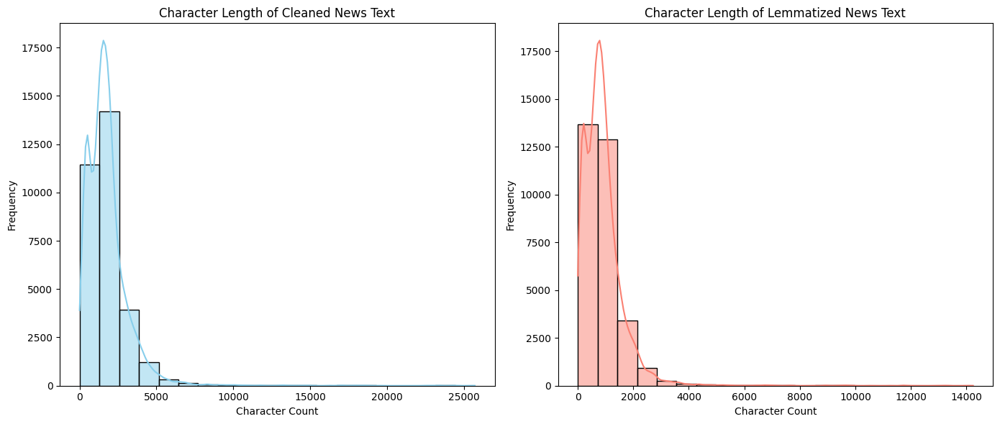

In [62]:
# Create a histogram plot to visualise character lengths

# Add histogram for cleaned news text

# Add histogram for lemmatized news text with POS tags removed

# Set up the figure
plt.figure(figsize=(14, 6))

# Histogram for cleaned_text length
plt.subplot(1, 2, 1)
sns.histplot(df_train['cleaned_text_len'], bins=20, kde=True, color='skyblue')
plt.title("Character Length of Cleaned News Text")
plt.xlabel("Character Count")
plt.ylabel("Frequency")

# Histogram for lemmatized_text length
plt.subplot(1, 2, 2)
sns.histplot(df_train['lemmatized_text_len'], bins=20, kde=True, color='salmon')
plt.title("Character Length of Lemmatized News Text")
plt.xlabel("Character Count")
plt.ylabel("Frequency")

# Show the plots
plt.tight_layout()
plt.show()

### **4.2** Find and display the top 40 words by frequency among true and fake news in Training data after processing the text  <font color = red>[10 marks]</font> <br>



##### 4.2.1 Find and display the top 40 words by frequency among true news in Training data after processing the text  <font color = red>[5 marks]</font> <br>

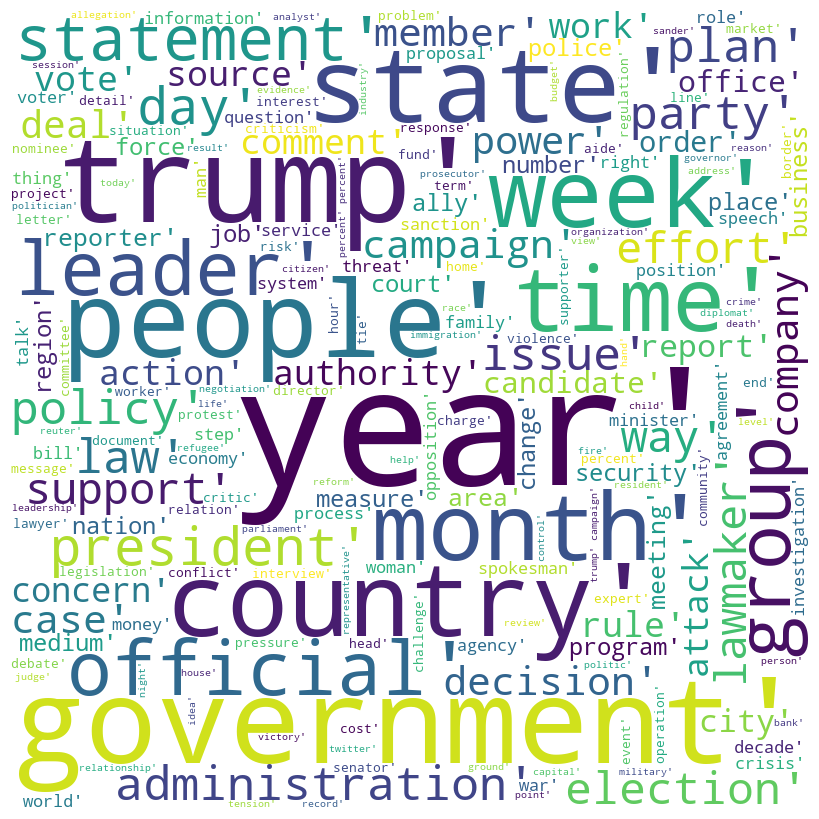

In [65]:
## Use a word cloud find the top 40 words by frequency among true news in the training data after processing the text

# Filter news with label 1 (True News) and convert to it string and handle any non-string values
df_train_true_news = df_train[df_train['news_label'] == 1]
# Generate word cloud for True News

from wordcloud import WordCloud
# Join all reviews into a single string
all_reviews = ' '.join(df_train_true_news['lemmatized_text'])
# Create a WordCloud object and generate the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(all_reviews)
# Display the word cloud
plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [66]:
df_train_true_news[['lemmatized_text']].head()

,lemmatized_text
18142,"['ally', 'year', 'line', 'week', 'village', 'border', 'alliance', 'election', 'loss', 'merkel', 'patch', 'coalition', 'conservative', 'ally', 'probusiness', 'green', 'task', 'conservative', 'dominance', 'state', 'election', 'year', 'support', 'cap', 'number', 'migrant', 'merkel', 'dismisse', 'cap', 'green', 'sister', 'party', 'try', 'resolve', 'difference', 'loss', 'election', 'seat', 'parliament', 'time', 'border', 'thousand', 'refugee', 'war', 'voter', 'vote', 'point', 'year', 'percent', 'figure', 'bavaria', 'oneparty', 'state', 'afd', 'share', 'shot', 'point', 'politician', 'afd', 'market', 'vote', 'point', 'csu', 'point', 'fall', 'asylum', 'seeker', 'money', 'pensioner', 'finance', 'month', 'state', 'break', 'recrimination', 'party', 'merkel', 'decision', 'border', 'migrant', 'decade', 'player', 'thank', 'strength', 'bavaria', 'lawmaker', 'state', 'dialect', 'leather', 'dress', 'state', 'world', 'war', 'region', 'today', 'bind', 'recover', 'blame', 'refugee', 'crisis', 'afd', 'success', 'demand', 'immigration', 'ceiling', 'refugee', 'year', 'cdu', 'idea', 'tension', 'week', 'leader', 'party', 'merkel', 'cdu', 'challenge', 'sister', 'party', 'program', 'coalition', 'party', 'cap', 'firm', 'afd', 'green', 'limit', 'wegscheid', 'summer', 'resident', 'migrant', 'window', 'direction', 'night', 'mayor', 'doubt', 'afd', 'theme', 'refugee', 'issue', 'border', 'people', 'smuggler', 'refugee', 'walk', 'call', 'resignation', 'cap', 'infrastructure', 'failing', 'coverage', 'internet', 'resident', 'education', 'mistake', 'people', 'strengthen', 'vote']"
15635,"['resign', 'ally', 'declaration', 'kingdom', 'plot', 'assassinate', 'backer', 'strife', 'resignation', 'coalition', 'government', 'resignation', 'decision', 'minister', 'broadcast', 'reason', 'hariri', 'decision', 'protest', 'response', 'resignation', 'result', 'escalation', 'question', 'ally', 'suggestion', 'grip', 'power', 'anticorruption', 'purge', 'royal', 'minister', 'investor', 'billionaire', 'kingdom', 'businessman']"
13286,"['party', 'nomination', 'run', 'president', 'year', 'silva', 'plan', 'sustainability', 'network', 'rede', 'community', 'amazon', 'election', 'vote', 'silva', 'party', 'nomination', 'brazilian', 'country', 'corruption', 'bearing', 'supporter', 'politician', 'role', 'election', 'prosecutor', 'police', 'anticorruption', 'drive', 'graft', 'party', 'silva', 'silva', 'responsibility', 'inflation', 'exchange', 'rate', 'policy', 'stability', 'period', 'inflation', 'growth', 'election', 'survey', 'datafolha', 'polling', 'institute', 'folha', 'newspaper', 'website', 'silva', 'percent', 'respondent', 'poll', 'candidate', 'lula', 'corruption', 'trial', 'court', 'uphold', 'conviction', 'election', 'silva', 'candidate', 'bolsonaro', 'lawmaker', 'percent', 'approval', 'percent', 'voter', 'twopercentagepoint', 'margin', 'error', 'election', 'silva', 'percent', 'firstround', 'vote', 'runoff', 'winner', 'dilma', 'party', 'ticket', 'eduardo', 'campos', 'campaign', 'plane', 'month', 'election', 'silva', 'spot', 'percent', 'runoff']"
16518,"['lawmaker', 'cut', 'aid', 'turkey', 'membership', 'bid', 'bid', 'join', 'leader', 'relation', 'euro', 'turkey', 'reform', 'infrastructure', 'lawmaker', 'euro', 'euro', 'reduction', 'turkey', 'right', 'record', 'freedom', 'speech', 'freedom', 'expression', 'right', 'standard', 'lawmaker', 'budget', 'discussion', 'cut', 'money', 'reform', 'infrastructure', 'leader', 'cut', 'agreement', 'summit', 'week', 'preaccession', 'aid', 'candidate', 'country', 'membership', 'merkel', 'action', 'turkey', 'reelection', 'campaign', 'behavior', 'right', 'decision', 'day', 'trial', 'istanbul', 'right', 'activist', 'turkey', 'merkel', 'rule', 'law', 'turkey', 'direction', 'reference', 'largescale', 'coup', 'attempt', 'coup', 'attempt', 'detention', 'citizen', 'national', 'jibe', 'behavior', 'euturkey', 'tie', 'purge', 'society', 'stability', 'country', 'decade', 'start', 'membership', 'membership', 'negotiation', 'country', 'call'

In [67]:
import ast
from collections import Counter
df_train_true_news['lemmatized_text'] = df_train_true_news['lemmatized_text'].apply(ast.literal_eval)
true_words = df_train_true_news['lemmatized_text']
true_counts = Counter(word for row in true_words for word in row)
top_true = true_counts.most_common(40)
top_true_df = pd.DataFrame(top_true, columns=['word', 'frequency'])
top_true_df

,word,frequency
0,trump,19495
1,year,13554
2,government,13193
3,state,12509
4,people,10497
5,election,9405
6,country,8948
7,official,8248
8,campaign,7439
9,week,7410


In [68]:
fig_true = px.bar(top_true_df, x='word', y='frequency', title='Top 40 Words in True News',
                  labels={'word': 'Word', 'frequency': 'Frequency'},
                  text='frequency')
fig_true.update_layout(xaxis_tickangle=-45)
fig_true.show()

##### 4.2.2 Find and display the top 40 words by frequency among fake news in Training data after processing the text  <font color = red>[5 marks]</font> <br>

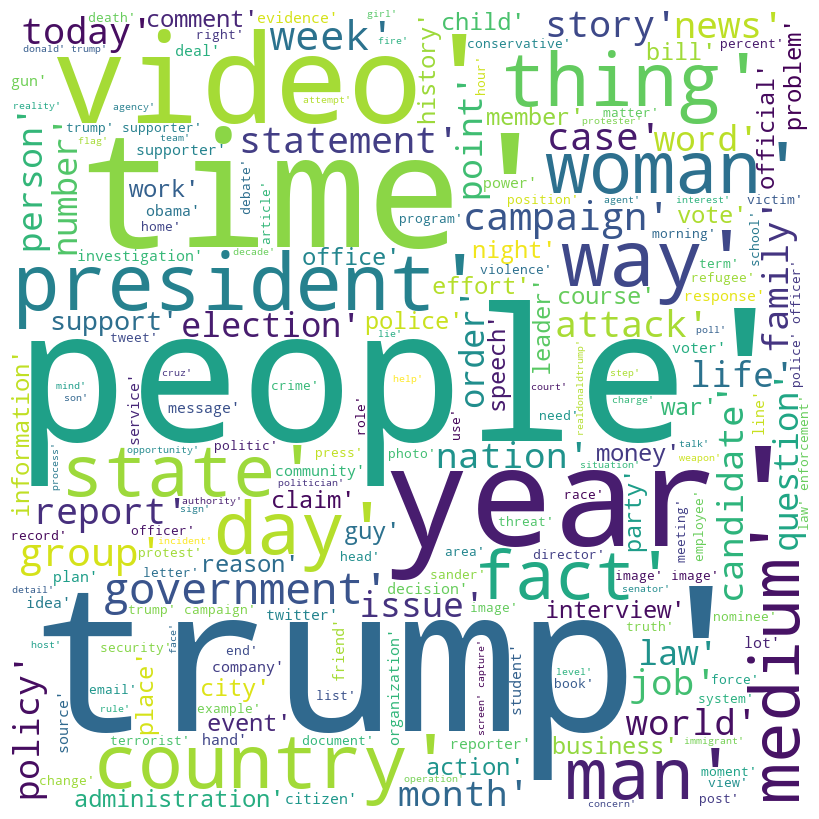

In [70]:
## Use a word cloud find the top 40 words by frequency among fake news in the training data after processing the text

# Filter news with label 0 (Fake News) and convert to it string and handle any non-string values
df_train_fake_news = df_train[df_train['news_label'] == 0]
# Generate word cloud for Fake News


# Join all reviews into a single string
all_reviews = ' '.join(df_train_fake_news['lemmatized_text'])
# Create a WordCloud object and generate the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(all_reviews)
# Display the word cloud
plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [71]:
df_train_fake_news['lemmatized_text'] = df_train_fake_news['lemmatized_text'].apply(ast.literal_eval)

In [72]:
fake_words = df_train_fake_news['lemmatized_text']
fake_counts = Counter(word for row in fake_words for word in row)
top_fake = fake_counts.most_common(40)
top_fake_df = pd.DataFrame(top_fake, columns=['word', 'frequency'])
top_fake_df

,word,frequency
0,trump,34741
1,people,18165
2,year,10836
3,video,10762
4,time,10730
5,image,9770
6,state,8253
7,president,8169
8,woman,8046
9,medium,7485


In [73]:
fig_fake = px.bar(top_fake_df, x='word', y='frequency', title='Top 40 Words in Fake News',
                  labels={'word': 'Word', 'frequency': 'Frequency'},
                  text='frequency')
fig_fake.update_layout(xaxis_tickangle=-45)
fig_fake.show()

### **4.3** Find and display the top unigrams, bigrams and trigrams by frequency in true news and fake news after processing the text  <font color = red>[20 marks]</font> <br>




##### 4.3.1 Write a function to get the specified top n-grams  <font color = red>[4 marks]</font> <br>



In [76]:
# Write a function to get the specified top n-grams
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter


def get_top_ngrams(corpus, ngram_range=(2, 2), top_n=10):
    """
    Get top N most frequent n-grams from a list or pandas Series of text.
    
    Args:
        corpus (list or Series): List of cleaned or lemmatized text documents.
        ngram_range (tuple): (min_n, max_n) for n-gram size. E.g. (2, 2) for bigrams.
        top_n (int): Number of top n-grams to return.
        
    Returns:
        List of tuples: [(ngram, frequency), ...]
    """
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    
    # Map n-grams to their frequency
    ngrams_freq = [(ngram, int(sum_words[0, idx])) for ngram, idx in vec.vocabulary_.items()]
    
    # Sort and return top N
    return sorted(ngrams_freq, key=lambda x: x[1], reverse=True)[:top_n]


In [77]:
def plot_ngrams(ngrams, title, color='steelblue'):
    words, counts = zip(*ngrams)
    plt.figure(figsize=(10, 5))
    sns.barplot(x=list(counts), y=list(words), palette=color)
    plt.title(title)
    plt.xlabel('Frequency')
    plt.ylabel('N-grams')
    plt.tight_layout()
    plt.show()


##### 4.3.2 Handle the NaN values  <font color = red>[1 mark]</font> <br>



In [79]:
# Handle NaN values in the text data
df_train_true_news.isnull().sum()

news_text              0
cleaned_text           0
lemmatized_text        0
news_label             0
cleaned_text_len       0
lemmatized_text_len    0
dtype: int64

In [80]:
df_fake_news.isnull().sum()

title         21
text          21
date          42
news_label     0
dtype: int64

### For True News




In [82]:
df_train_true_news['joined_text'] = df_train_true_news['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))

##### 4.3.3 Display the top 10 unigrams by frequency in true news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>

Top 10 Unigrams in TRUE News:
 [('trump', 19495), ('year', 13554), ('government', 13193), ('state', 12509), ('people', 10497), ('election', 9405), ('country', 8948), ('official', 8248), ('campaign', 7439), ('week', 7410)]


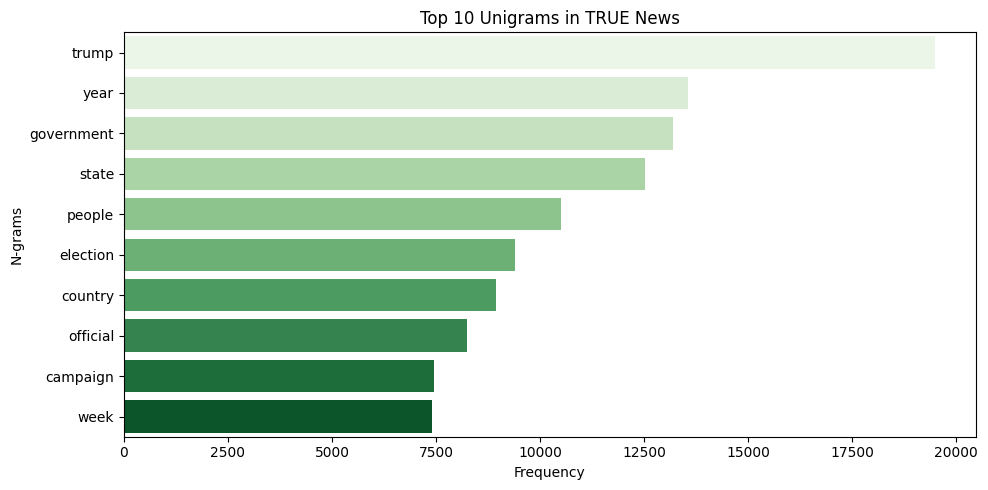

In [84]:
# Print the top 10 unigrams by frequency in true news and plot the same using a bar graph
true_unigrams = get_top_ngrams(df_train_true_news['joined_text'], ngram_range=(1, 1), top_n=10)
print("Top 10 Unigrams in TRUE News:\n", true_unigrams)
plot_ngrams(true_unigrams, "Top 10 Unigrams in TRUE News", color='Greens')

##### 4.3.4 Display the top 10 bigrams by frequency in true news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>



Top 10 Bigrams in TRUE News:
 [('trump campaign', 885), ('percent percent', 847), ('request comment', 710), ('security force', 707), ('climate change', 696), ('tax reform', 679), ('intelligence agency', 582), ('right group', 573), ('news conference', 547), ('tax cut', 542)]


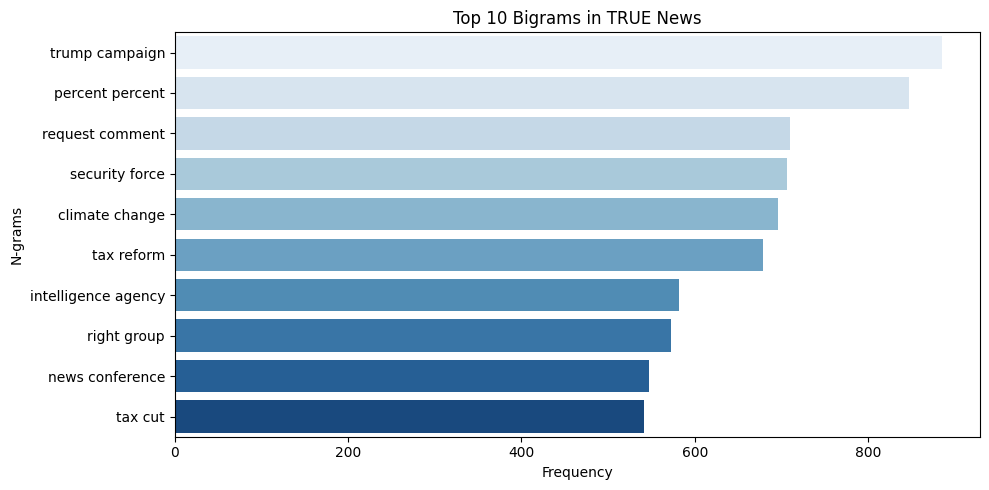

In [86]:
# Print the top 10 bigrams by frequency in true news and plot the same using a bar graph

true_bigrams = get_top_ngrams(df_train_true_news['joined_text'], ngram_range=(2, 2), top_n=10)

#true_bigrams = get_top_ngrams(df_true_news, ngram_range=(2, 2), top_n=10)
print("Top 10 Bigrams in TRUE News:\n", true_bigrams)
plot_ngrams(true_bigrams, "Top 10 Bigrams in TRUE News", color='Blues')


##### 4.3.5 Display the top 10 trigrams by frequency in true news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>



Top 10 Trigrams in TRUE News:
 [('official condition anonymity', 182), ('tax rate percent', 166), ('reuter editorial staff', 165), ('percent percent percent', 144), ('circuit court appeal', 124), ('editorial staff sap', 122), ('staff sap involvement', 122), ('sap involvement creation', 122), ('involvement creation production', 122), ('rate percent percent', 111)]


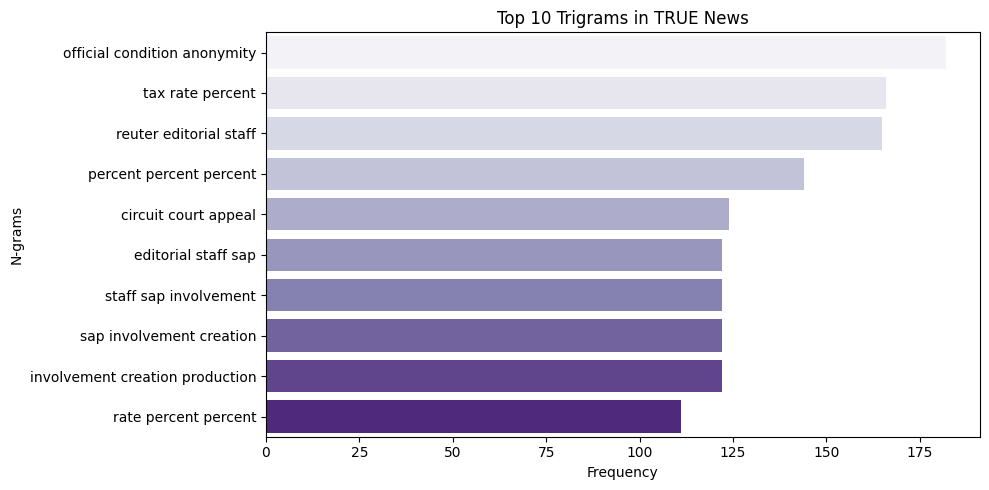

In [88]:
# Print the top 10 trigrams by frequency in true news and plot the same using a bar graph
true_trigrams = get_top_ngrams(df_train_true_news['joined_text'], ngram_range=(3, 3), top_n=10)
print("Top 10 Trigrams in TRUE News:\n", true_trigrams)
plot_ngrams(true_trigrams, "Top 10 Trigrams in TRUE News", color='Purples')

### For Fake News







In [90]:
df_train_fake_news['joined_text'] = df_train_fake_news['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))

##### 4.3.6 Display the top 10 unigrams by frequency in fake news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>

Top 10 Unigrams in FAKE News:
 [('trump', 34741), ('people', 18165), ('year', 10836), ('video', 10762), ('time', 10730), ('image', 9770), ('state', 8253), ('president', 8169), ('woman', 8046), ('medium', 7485)]


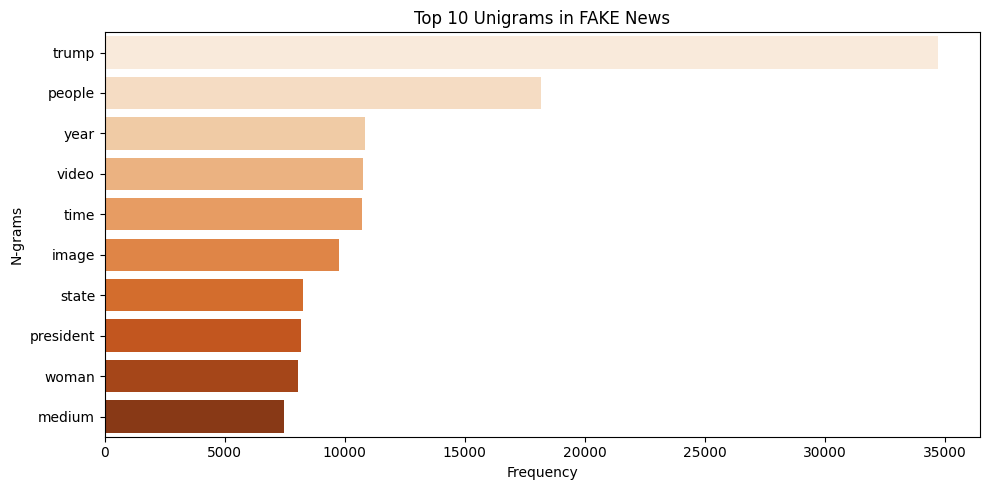

In [92]:
# Print the top 10 unigrams by frequency in fake news and plot the same using a bar graph
fake_unigrams = get_top_ngrams(df_train_fake_news['joined_text'], ngram_range=(1, 1), top_n=10)
print("Top 10 Unigrams in FAKE News:\n", fake_unigrams)
plot_ngrams(fake_unigrams, "Top 10 Unigrams in FAKE News", color='Oranges')


##### 4.3.7 Display the top 10 bigrams by frequency in fake news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>



Top 10 Bigrams in FAKE News:
 [('trump supporter', 1414), ('trump campaign', 1291), ('image image', 1284), ('police officer', 1172), ('law enforcement', 1073), ('donald trump', 1028), ('screen capture', 929), ('mainstream medium', 821), ('president trump', 745), ('climate change', 734)]


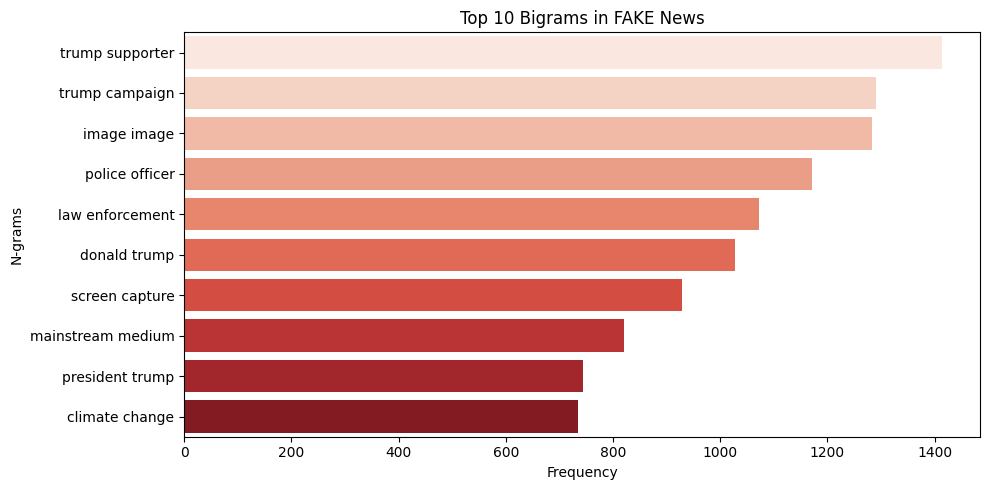

In [94]:
# Print the top 10 bigrams by frequency in fake news and plot the same using a bar graph
fake_bigrams = get_top_ngrams(df_train_fake_news['joined_text'], ngram_range=(2, 2), top_n=10)
print("Top 10 Bigrams in FAKE News:\n", fake_bigrams)
plot_ngrams(fake_bigrams, "Top 10 Bigrams in FAKE News", color='Reds')

##### 4.3.8 Display the top 10 trigrams by frequency in fake news and plot them as a bar graph  <font color = red>[2.5 marks]</font> <br>



Top 10 Trigrams in FAKE News:
 [('video screen capture', 520), ('image video screen', 503), ('image getty image', 311), ('image screen capture', 308), ('wire subscribe member', 238), ('image chip image', 180), ('image video screenshot', 164), ('law enforcement officer', 153), ('broadcast boiler room', 148), ('talk radio custommade', 143)]


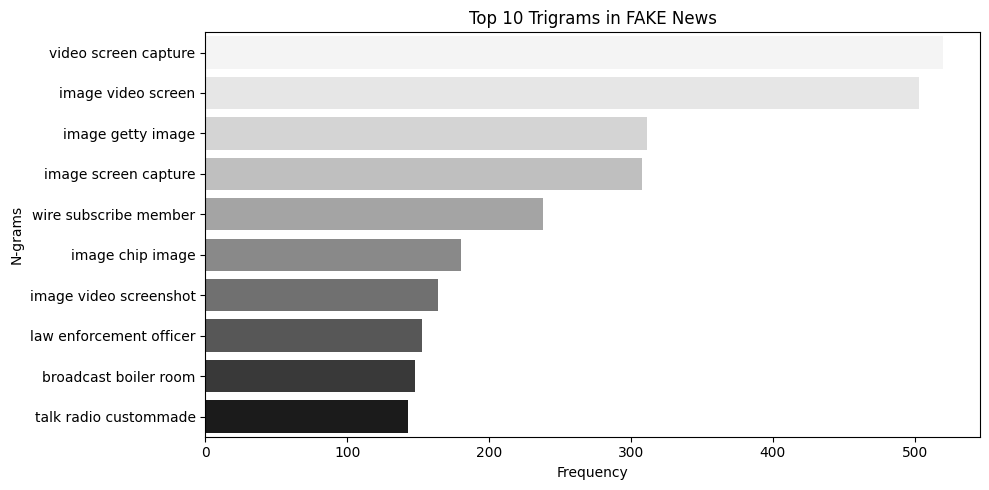

In [96]:
# Print the top 10 trigrams by frequency in fake news and plot the same using a bar graph
fake_trigrams = get_top_ngrams(df_train_fake_news['joined_text'], ngram_range=(3, 3), top_n=10)
print("Top 10 Trigrams in FAKE News:\n", fake_trigrams)
plot_ngrams(fake_trigrams, "Top 10 Trigrams in FAKE News", color='Greys')

## **5.** Exploratory Data Analysis on Validation Data [Optional]

Perform EDA on validation data to differentiate EDA on training data with EDA on validation data and the tasks are given below:

<ul>
  <li> Visualise the data according to the character length of cleaned news text and lemmatized text with POS tags removed
  <li> Using a word cloud find the top 40 words by frequency in true and fake news separately
  <li> Find the top unigrams, bigrams and trigrams by frequency in true and fake news separately
</ul>





### **5.1** Visualise character lengths of cleaned news text and lemmatized news text with POS tags removed

In [99]:
df_test = X_test.copy()
df_test['news_label'] = y_test.values

##### 5.1.1  Add new columns to calculate the character lengths of the processed data columns

In [101]:
# Add a new column to calculate the character length of cleaned news text
df_test['cleaned_text_len'] = df_test['cleaned_text'].apply(len)
# Add a new column to calculate the character length of lemmatized news text with POS tags removed
df_test['lemmatized_text_len'] = df_test['lemmatized_text'].apply(len)


##### 5.1.2  Create Histogram to visualise character lengths

Plot both distributions on the same graph for comparison and to observe overlaps and peak differences to understand text preprocessing's impact on text length.

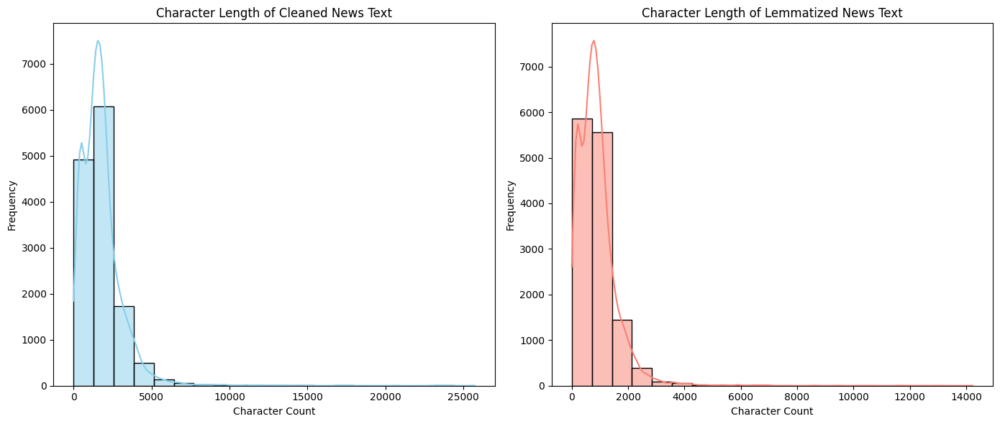

In [103]:
# Create a histogram plot to visualise character lengths

# Add histogram for cleaned news text

# Add histogram for lemmatized news text with POS tags removed

plt.figure(figsize=(14, 6))

# Histogram for cleaned_text length
plt.subplot(1, 2, 1)
sns.histplot(df_test['cleaned_text_len'], bins=20, kde=True, color='skyblue')
plt.title("Character Length of Cleaned News Text")
plt.xlabel("Character Count")
plt.ylabel("Frequency")

# Histogram for lemmatized_text length
plt.subplot(1, 2, 2)
sns.histplot(df_test['lemmatized_text_len'], bins=20, kde=True, color='salmon')
plt.title("Character Length of Lemmatized News Text")
plt.xlabel("Character Count")
plt.ylabel("Frequency")

# Show the plots
plt.tight_layout()
plt.show()

### **5.2** Find and display the top 40 words by frequency among true and fake news after processing the text

In [105]:
df_test_true_news = df_test[df_test['news_label'] == 1]

In [106]:
df_test_fake_news = df_test[df_test['news_label'] == 0]

##### 5.2.1  Find and display the top 40 words by frequency among true news in validation data after processing the text

In [108]:
## Use a word cloud find the top 40 words by frequency among true news after processing the text

# Generate word cloud for True News

# Join all reviews into a single string
df_test_true_news['lemmatized_text'] = df_test_true_news['lemmatized_text'].apply(ast.literal_eval)
true_words = df_test_true_news['lemmatized_text']
true_counts = Counter(word for row in true_words for word in row)
top_true = true_counts.most_common(40)
top_true_df = pd.DataFrame(top_true, columns=['word', 'frequency'])
top_true_df

,word,frequency
0,trump,8144
1,year,5781
2,government,5530
3,state,5311
4,people,4375
5,election,4112
6,country,3852
7,official,3511
8,leader,3132
9,week,3099


##### 5.2.2  Find and display the top 40 words by frequency among fake news in validation data after processing the text

In [110]:
## Use a word cloud find the top 40 words by frequency among fake news after processing the text

# Generate word cloud for Fake News
df_test_fake_news['lemmatized_text'] = df_test_fake_news['lemmatized_text'].apply(ast.literal_eval)
fake_words = df_test_fake_news['lemmatized_text']
fake_counts = Counter(word for row in fake_words for word in row)
top_fake = fake_counts.most_common(40)
top_fake_df = pd.DataFrame(top_fake, columns=['word', 'frequency'])
top_fake_df

,word,frequency
0,trump,14021
1,people,7664
2,year,4538
3,video,4524
4,time,4496
5,image,4140
6,state,3568
7,president,3383
8,campaign,3218
9,woman,3148


### **5.3** Find and display the top unigrams, bigrams and trigrams by frequency in true news and fake news after processing the text  





##### 5.3.1 Write a function to get the specified top n-grams

In [113]:
## Write a function to get the specified top n-grams

def get_top_ngrams(corpus, ngram_range=(2, 2), top_n=10):
    """
    Get top N most frequent n-grams from a list or pandas Series of text.
    
    Args:
        corpus (list or Series): List of cleaned or lemmatized text documents.
        ngram_range (tuple): (min_n, max_n) for n-gram size. E.g. (2, 2) for bigrams.
        top_n (int): Number of top n-grams to return.
        
    Returns:
        List of tuples: [(ngram, frequency), ...]
    """
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    
    # Map n-grams to their frequency
    ngrams_freq = [(ngram, int(sum_words[0, idx])) for ngram, idx in vec.vocabulary_.items()]
    
    # Sort and return top N
    return sorted(ngrams_freq, key=lambda x: x[1], reverse=True)[:top_n]

##### 5.3.2 Handle the NaN values

In [115]:
## First handle NaN values in the text data
df_test_true_news.isnull().sum()

news_text              0
cleaned_text           0
lemmatized_text        0
news_label             0
cleaned_text_len       0
lemmatized_text_len    0
dtype: int64

In [116]:
df_test_fake_news.isnull().sum()

news_text              0
cleaned_text           0
lemmatized_text        0
news_label             0
cleaned_text_len       0
lemmatized_text_len    0
dtype: int64

### For True News


In [118]:
df_test_true_news['joined_text'] = df_test_true_news['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))


##### 5.3.3 Display the top 10 unigrams by frequency in true news and plot them as a bar graph

Top 10 Unigrams in TRUE News:
 [('trump', 8144), ('year', 5781), ('government', 5530), ('state', 5311), ('people', 4375), ('election', 4112), ('country', 3852), ('official', 3511), ('leader', 3132), ('week', 3099)]


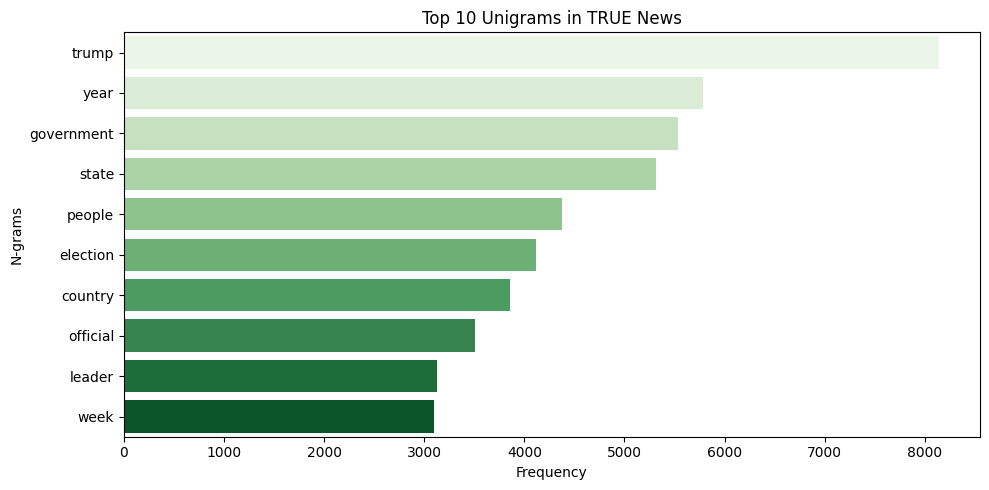

In [120]:
## Print the top 10 unigrams by frequency in true news and plot the same using a bar graph
true_unigrams = get_top_ngrams(df_test_true_news['joined_text'], ngram_range=(1, 1), top_n=10)
print("Top 10 Unigrams in TRUE News:\n", true_unigrams)
plot_ngrams(true_unigrams, "Top 10 Unigrams in TRUE News", color='Greens')

##### 5.3.4 Display the top 10 bigrams by frequency in true news and plot them as a bar graph

Top 10 Bigrams in TRUE News:
 [('percent percent', 379), ('trump campaign', 332), ('request comment', 315), ('tax reform', 307), ('climate change', 301), ('security force', 271), ('intelligence agency', 263), ('news conference', 241), ('right group', 239), ('election campaign', 221)]


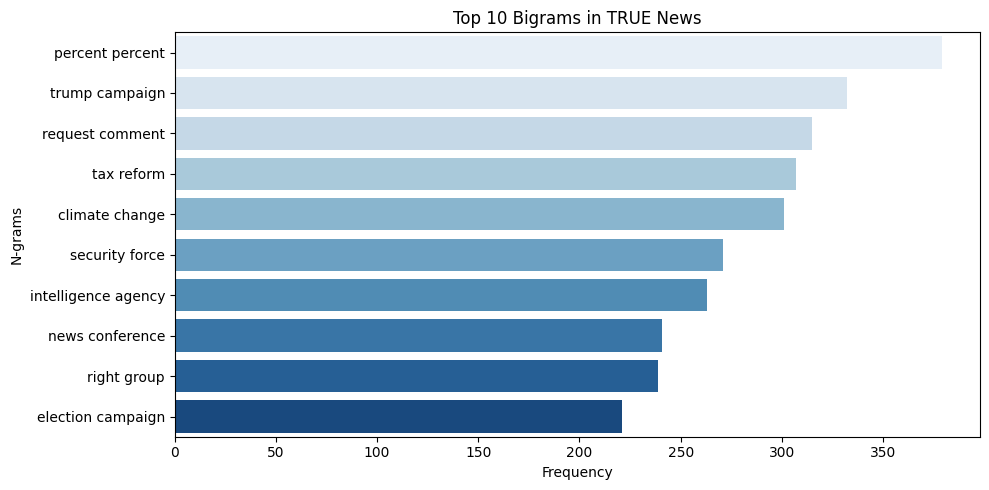

In [122]:
## Print the top 10 bigrams by frequency in true news and plot the same using a bar graph
true_bigrams = get_top_ngrams(df_test_true_news['joined_text'], ngram_range=(2, 2), top_n=10)

#true_bigrams = get_top_ngrams(df_true_news, ngram_range=(2, 2), top_n=10)
print("Top 10 Bigrams in TRUE News:\n", true_bigrams)
plot_ngrams(true_bigrams, "Top 10 Bigrams in TRUE News", color='Blues')

##### 5.3.5 Display the top 10 trigrams by frequency in true news and plot them as a bar graph

Top 10 Trigrams in TRUE News:
 [('reuter editorial staff', 81), ('tax rate percent', 71), ('editorial staff sap', 58), ('staff sap involvement', 58), ('sap involvement creation', 58), ('involvement creation production', 58), ('official condition anonymity', 57), ('rate percent percent', 51), ('article reuter editorial', 51), ('percent percent percent', 43)]


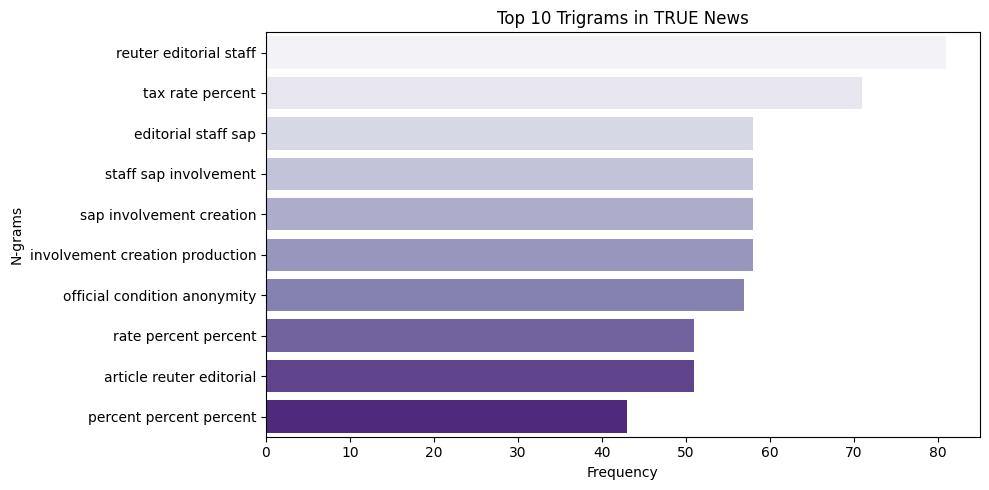

In [124]:
## Print the top 10 trigrams by frequency in true news and plot the same using a bar graph
true_trigrams = get_top_ngrams(df_test_true_news['joined_text'], ngram_range=(3, 3), top_n=10)
print("Top 10 Trigrams in TRUE News:\n", true_trigrams)
plot_ngrams(true_trigrams, "Top 10 Trigrams in TRUE News", color='Purples')

### For Fake News

In [126]:
df_test_fake_news['joined_text'] = df_test_fake_news['lemmatized_text'].apply(lambda tokens: ' '.join(tokens))

##### 5.3.6 Display the top 10 unigrams by frequency in fake news and plot them as a bar graph

Top 10 Unigrams in FAKE News:
 [('trump', 14021), ('people', 7664), ('year', 4538), ('video', 4524), ('time', 4496), ('image', 4140), ('state', 3568), ('president', 3383), ('campaign', 3218), ('woman', 3148)]


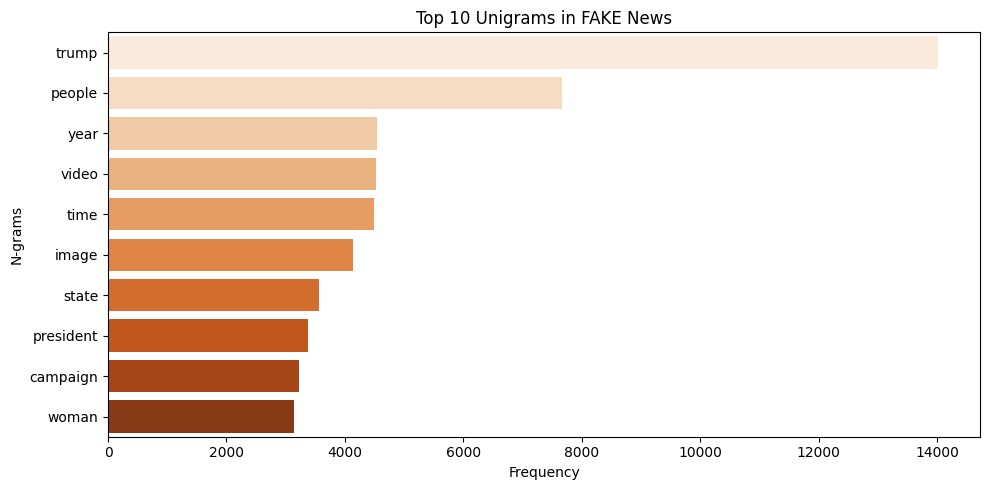

In [128]:
## Print the top 10 unigrams by frequency in fake news and plot the same using a bar graph
fake_unigrams = get_top_ngrams(df_test_fake_news['joined_text'], ngram_range=(1, 1), top_n=10)
print("Top 10 Unigrams in FAKE News:\n", fake_unigrams)
plot_ngrams(fake_unigrams, "Top 10 Unigrams in FAKE News", color='Oranges')

##### 5.3.7 Display the top 10 bigrams by frequency in fake news and plot them as a bar graph

Top 10 Bigrams in FAKE News:
 [('trump supporter', 616), ('image image', 591), ('trump campaign', 565), ('police officer', 507), ('law enforcement', 435), ('donald trump', 400), ('screen capture', 398), ('president trump', 327), ('mainstream medium', 313), ('image video', 270)]


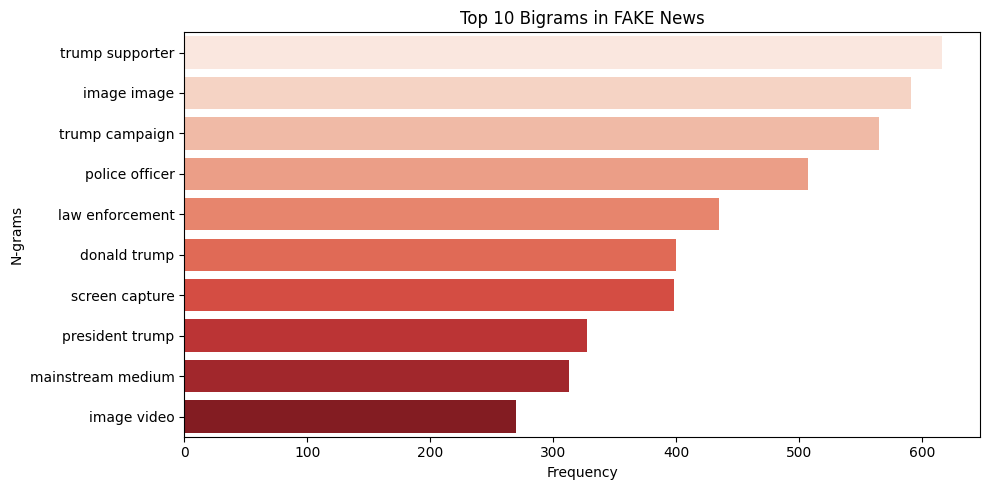

In [130]:
## Print the top 10 bigrams by frequency in fake news and plot the same using a bar graph
fake_bigrams = get_top_ngrams(df_test_fake_news['joined_text'], ngram_range=(2, 2), top_n=10)
print("Top 10 Bigrams in FAKE News:\n", fake_bigrams)
plot_ngrams(fake_bigrams, "Top 10 Bigrams in FAKE News", color='Reds')

##### 5.3.8 Display the top 10 trigrams by frequency in fake news and plot them as a bar graph

Top 10 Trigrams in FAKE News:
 [('video screen capture', 208), ('image video screen', 195), ('image screen capture', 143), ('image getty image', 131), ('wire subscribe member', 117), ('image chip image', 79), ('law enforcement officer', 72), ('story story story', 72), ('broadcast boiler room', 67), ('image video screenshot', 67)]


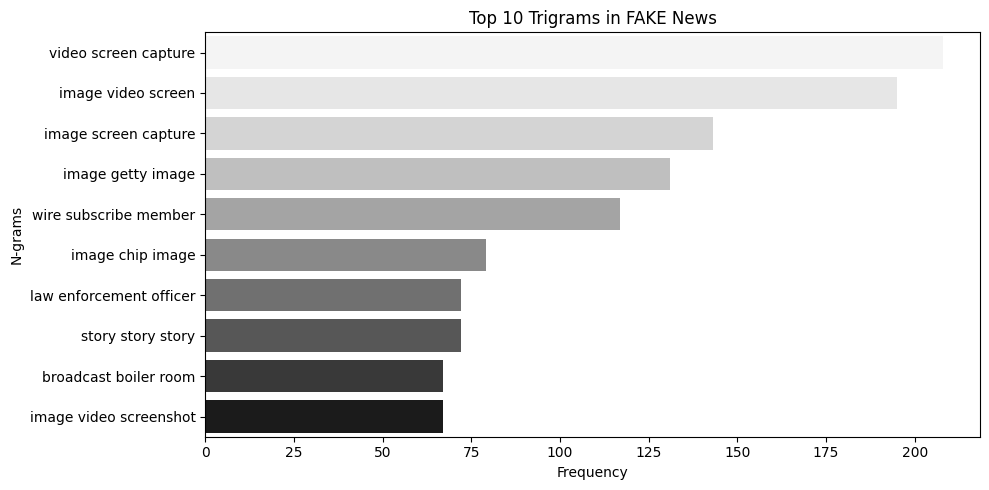

In [132]:
## Print the top 10 trigrams by frequency in fake news and plot the same using a bar graph
fake_trigrams = get_top_ngrams(df_test_fake_news['joined_text'], ngram_range=(3, 3), top_n=10)
print("Top 10 Trigrams in FAKE News:\n", fake_trigrams)
plot_ngrams(fake_trigrams, "Top 10 Trigrams in FAKE News", color='Greys')

## **6.** Feature Extraction  <font color = red>[10 marks]</font> <br>

For any ML model to perform classification on textual data, you need to convert it to a vector form. In this assignment, you will use the Word2Vec Vectorizer to create vectors from textual data. Word2Vec model captures the semantic relationship between words.


### **6.1** Initialise Word2Vec model  <font color = red>[2 marks]</font>

In [135]:
## Write your code here to initialise the Word2Vec model by downloading "word2vec-google-news-300"
import gensim.downloader as api

# Download and load the model
word2vec_model = api.load("word2vec-google-news-300")

# Confirm it’s loaded
print(f"Model loaded with {len(word2vec_model)} word vectors.")

Model loaded with 3000000 word vectors.


### **6.2** Extract vectors for cleaned news data   <font color = red>[8 marks]</font>

In [137]:
X_train_orig = X_train.copy()
X_test_orig = X_test.copy()
print(X_train_orig.shape)
print(X_test_orig.shape)

(31443, 3)
(13476, 3)


In [138]:
X_train['lemmatized_text'] = X_train['lemmatized_text'].apply(ast.literal_eval)
X_test['lemmatized_text'] = X_test['lemmatized_text'].apply(ast.literal_eval)

In [139]:
print(X_train['lemmatized_text'][0])

['budget', 'fight', 'script', 'faction', 'month', 'expansion', 'debt', 'tax', 'cut', 'budget', 'restraint', 'pivot', 'way', 'representative', 'mark', 'meadow', 'face', 'nation', 'line', 'spending', 'lawmaker', 'battle', 'holiday', 'lawmaker', 'budget', 'fight', 'issue', 'immigration', 'policy', 'election', 'campaign', 'republican', 'budget', 'increase', 'spending', 'democrat', 'increase', 'spending', 'program', 'education', 'research', 'infrastructure', 'health', 'administration', 'increase', 'nondefense', 'spending', 'percent', 'chairman', 'house', 'freedom', 'program', 'government', 'pay', 'raise', 'percent', 'conservative', 'rationale', 'people', 'money', 'meadow', 'tax', 'overhaul', 'balloon', 'budget', 'deficit', 'year', 'debt', 'responsibility', 'tax', 'bill', 'generation', 'finance', 'tax', 'cut', 'corporation', 'bill', 'history', 'house', 'representative', 'year', 'tax', 'package', 'tax', 'overhaul', 'year', 'economy', 'job', 'growth', 'house', 'speaker', 'tax', 'bill', 'meadow

In [140]:
## Write your code here to extract the vectors from the Word2Vec model for both training and validation data
def get_doc_vector(doc, model):
    vectors = [model[word] for word in doc if word in model]
    if vectors:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(model.vector_size)



In [141]:
## Extract the target variable for the training data and validation data
# Extract document embeddings
X_train_vectors = X_train['lemmatized_text'].apply(lambda x: get_doc_vector(x, word2vec_model)).tolist()
X_val_vectors = X_test['lemmatized_text'].apply(lambda x: get_doc_vector(x, word2vec_model)).tolist()

In [142]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train_vec = le.fit_transform(y_train)
y_val_vec = le.transform(y_test)

## **7.** Model Training and Evaluation <font color = red>[45 marks]</font>

You will use a set of supervised models to classify the news into true or fake.

### **7.0** Import models and evaluation metrics

In [145]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report

In [146]:
from sklearn import metrics
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [147]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

### **7.1** Build Logistic Regression Model  <font color = red>[15 marks]</font>

##### 7.1.1 Create and train logistic regression model on training data  <font color = red>[10 marks]</font>

In [150]:
## Initialise Logistic Regression model
logistic_pipeline = LogisticRegression(max_iter=1000, random_state=42)


## Train Logistic Regression model on training data
logistic_model = logistic_pipeline.fit(X_train_vectors, y_train_vec)

## Predict on validation data
pred_lr = logistic_model.predict(X_val_vectors)

##### 7.1.2 Calculate and print accuracy, precision, recall and f1-score on validation data <font color = red>[5 marks]</font>

In [152]:
## Calculate and print accuracy, precision, recall, f1-score on predicted labels
logistic_confusion_matrix = metrics.confusion_matrix(y_val_vec, pred_lr)
print(logistic_confusion_matrix)

[[6372  679]
 [ 617 5808]]


Confusion matrix, without normalization


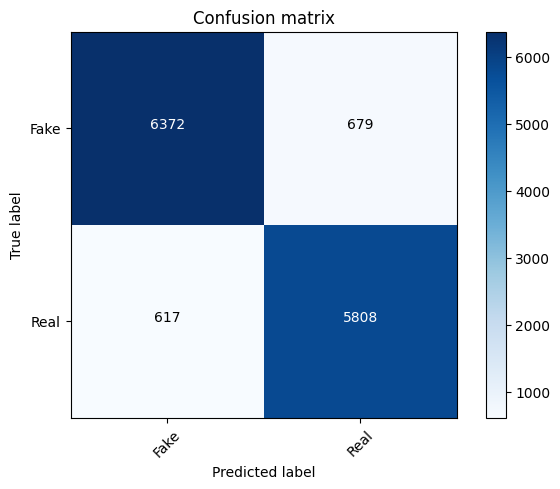

In [153]:
plot_confusion_matrix(logistic_confusion_matrix, classes=['Fake', 'Real'])

In [154]:
# Classification Report
print (classification_report(y_val_vec, pred_lr))

              precision    recall  f1-score   support

           0       0.91      0.90      0.91      7051
           1       0.90      0.90      0.90      6425

    accuracy                           0.90     13476
   macro avg       0.90      0.90      0.90     13476
weighted avg       0.90      0.90      0.90     13476



In [155]:
print("Accuracy of the Logistic Regression Model is : {}%".format(round(accuracy_score(y_val_vec, pred_lr)*100,2)))
print("Precision of the Logistic Regression Model is : {}%".format(round(precision_score(y_val_vec, pred_lr)*100,2)))
print("Recall of the Logistic Regression Model is : {}%".format(round(recall_score(y_val_vec, pred_lr)*100,2)))
print("F1 Score of the Logistic Regression Model is : {}%".format(round(f1_score(y_val_vec, pred_lr)*100,2)))

Accuracy of the Logistic Regression Model is : 90.38%
Precision of the Logistic Regression Model is : 89.53%
Recall of the Logistic Regression Model is : 90.4%
F1 Score of the Logistic Regression Model is : 89.96%


### **7.2** Build Decision Tree Model <font color = red>[15 marks]</font>

##### 7.2.1 Create and train a decision tree model on training data <font color = red>[10 marks]</font>

In [158]:
## Initialise Decision Tree model
decision_tree_pipeline = DecisionTreeClassifier()

## Train Decision Tree model on training data
dt_model = decision_tree_pipeline.fit(X_train_vectors, y_train_vec)

## Predict on validation data
pred_dt = dt_model.predict(X_val_vectors)

##### 7.2.2 Calculate and print accuracy, precision, recall and f1-score on validation data <font color = red>[5 marks]</font>

In [160]:
## Calculate and print accuracy, precision, recall, f1-score on predicted labels
dt_confusion_matrix = metrics.confusion_matrix(y_val_vec, pred_dt)
print(dt_confusion_matrix)

[[5990 1061]
 [1306 5119]]


Confusion matrix, without normalization


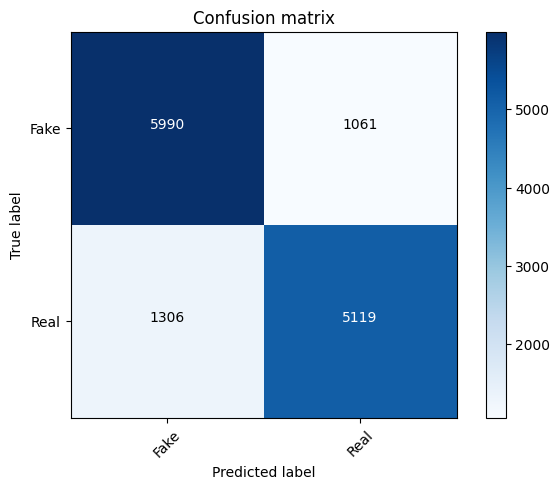

In [161]:
plot_confusion_matrix(dt_confusion_matrix, classes=['Fake', 'Real'])

In [162]:
# Classification Report
print (classification_report(y_val_vec, pred_dt))

              precision    recall  f1-score   support

           0       0.82      0.85      0.84      7051
           1       0.83      0.80      0.81      6425

    accuracy                           0.82     13476
   macro avg       0.82      0.82      0.82     13476
weighted avg       0.82      0.82      0.82     13476



In [163]:
print("Accuracy of the Decision Tree Model is : {}%".format(round(accuracy_score(y_val_vec, pred_dt)*100,2)))
print("Precision of the Decision Tree Model Model is : {}%".format(round(precision_score(y_val_vec, pred_dt)*100,2)))
print("Recall of the Decision Tree Model Model is : {}%".format(round(recall_score(y_val_vec, pred_dt)*100,2)))
print("F1 Score of the Decision Tree Model Model is : {}%".format(round(f1_score(y_val_vec, pred_dt)*100,2)))

Accuracy of the Decision Tree Model is : 82.44%
Precision of the Decision Tree Model Model is : 82.83%
Recall of the Decision Tree Model Model is : 79.67%
F1 Score of the Decision Tree Model Model is : 81.22%


### **7.3** Build Random Forest Model <font color = red>[15 marks]</font>


##### 7.3.1 Create and train a random forest model on training data <font color = red>[10 marks]</font>

In [166]:
## Initialise Random Forest model
random_forest_pipeline = RandomForestClassifier(random_state = 42)

## Train Random Forest model on training data
random_forest_model = random_forest_pipeline.fit(X_train_vectors, y_train_vec)

## Predict on validation data
pred_rf = random_forest_model.predict(X_val_vectors)

 ##### 7.3.2 Calculate and print accuracy, precision, recall and f1-score on validation data <font color = red>[5 marks]</font>

In [168]:
## Calculate and print accuracy, precision, recall, f1-score on predicted labels
rf_confusion_matrix = metrics.confusion_matrix(y_val_vec, pred_rf)
print(rf_confusion_matrix)

[[6485  566]
 [ 660 5765]]


Confusion matrix, without normalization


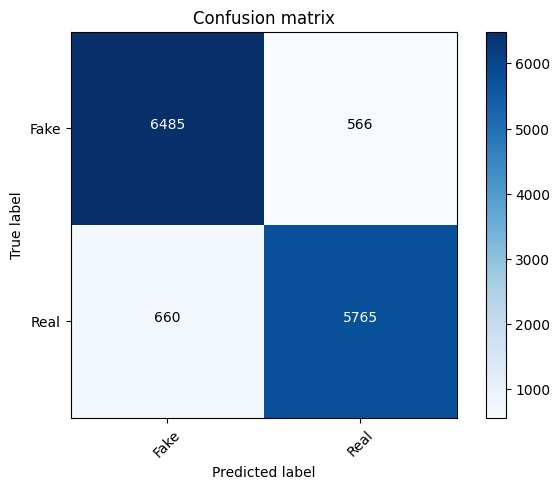

In [169]:
plot_confusion_matrix(rf_confusion_matrix, classes=['Fake', 'Real'])

In [170]:
# Classification Report
print (classification_report(y_val_vec, pred_rf))

              precision    recall  f1-score   support

           0       0.91      0.92      0.91      7051
           1       0.91      0.90      0.90      6425

    accuracy                           0.91     13476
   macro avg       0.91      0.91      0.91     13476
weighted avg       0.91      0.91      0.91     13476



In [171]:
print("Accuracy of the Random Forest Model is : {}%".format(round(accuracy_score(y_val_vec, pred_rf)*100,2)))
print("Precision of the Random Forest Model Model is : {}%".format(round(precision_score(y_val_vec, pred_rf)*100,2)))
print("Recall of the Random Forest Model Model is : {}%".format(round(recall_score(y_val_vec, pred_rf)*100,2)))
print("F1 Score of the Random Forest Model Model is : {}%".format(round(f1_score(y_val_vec, pred_rf)*100,2)))

Accuracy of the Random Forest Model is : 90.9%
Precision of the Random Forest Model Model is : 91.06%
Recall of the Random Forest Model Model is : 89.73%
F1 Score of the Random Forest Model Model is : 90.39%


## **8.** Conclusion <font color = red>[5 marks]</font>

Summarise your findings by discussing patterns observed in true and fake news and how semantic classification addressed the problem. Highlight the best model chosen, the evaluation metric prioritised for the decision, and assess the approach and its impact.

### Input data observations:

#### Input Stats 

**True News:**
  . 21417 rows
  . 3 columns

**Fake News:**
  . 23423 rows
  . 3 columns

#### Derived columns
1) **news_label** : 1 for true news and 0 for fake news
2) **news_text** : title + " "+ text
3) **cleaned_text** : cleaned the text & remove all the unnecessary elements
4) **lemmatized_text** : derived text with POS tagging and lemmatization,by filtering stopwords and keeping only NN and NNS tags


### Train Test Split:
1) **70%** of input data used for training
2) **30%** of input data used for validation
3) **stratify** option to used to handle class imbalance if any
4) **random_state** option used for maintaining the reproducibility and consistency across experiments

### Exploratory Data Analysis:

1) word cloud used to determine top 40 words by frequency among true news & fake news in the training data after processing the text

   a) The word **"trump"** in true news has high frequency - **19495**

   b) The word **"trump"** in fake news has high frequency - **34741**

2) word cloud used to determine top 40 words by frequency among true news & fake news in the validation data after processing the text

   a) The word **"trump"** in true news has high frequency - **8144**

   b) The word **"trump"** in fake news has high frequency - **14021**

3) observation **"trump"** is common word with high frequency irrespective of whether its true news or fake news or training data or validation data

4) **Top 10 unigrams, bigrams & trigrams** in both true news & fake news based on the frequency and plotted bar graphs for training data

5) **Top 10 unigrams, bigrams & trigrams** in both true news & fake news based on the frequency and plotted bar graphs for validation data



### Feature extraction:
1) **Word2Vec** model from genism package used for feature extraction

2) Extracted the vectors for lemmatized_text using Word2Vec model

3) **LabelEncoder** used to encode target variable

### Model Training & Evaluation:

#### Logistic Regression:
1) Accuracy of the Logistic Regression Model is : **90.38%**
2) Precision of the Logistic Regression Model is : **89.53%**
3) Recall of the Logistic Regression Model is : **90.4%**
4) F1 Score of the Logistic Regression Model is : **89.96%**

#### Decision Tree Classifier
1) Accuracy of the Decision Tree Model is : **82.44%**
2) Precision of the Decision Tree Model Model is : **82.83%**
3) Recall of the Decision Tree Model Model is : **79.67%**
4) F1 Score of the Decision Tree Model Model is : **81.22%**

#### Random Forest Model
1) Accuracy of the Random Forest Model is : **90.9%**
2) Precision of the Random Forest Model Model is : **91.06%**
3) Recall of the Random Forest Model Model is : **89.73%**
4) F1 Score of the Random Forest Model Model is : **90.39%**

**Random Forest Model** given highest accuracy **90.9%** compared to other models

### **Best Model Chosen: Random Forest**

- **Evaluation Metric Prioritised**: The **F1-score** was chosen as the primary evaluation metric to maintain a balance between **precision and recall**. This ensured that both false positives and false negatives were minimized, which is crucial in the context of fake news detection where both types of errors can have significant consequences.

- **Impact Assessment**:
The Random Forest model, integrated with Word2Vec embeddings, demonstrated strong performance and generalizability. Its ensemble architecture enabled it to explore diverse decision boundaries, effectively capturing subtle semantic nuances in textual data. This combination not only improved classification accuracy but also facilitated the extraction of meaningful linguistic patterns, making it a practical and scalable solution for real-world fake news detection systems.